# Lecture 1: Regression

Stefan Bucher

<a href="https://colab.research.google.com/github/MLecon/ML-in-Economics/blob/main/1_linearRegression.ipynb" target="_blank">
<img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open in Colab">
</a>

Prince (2023, chaps. 2, 6, 8, 9).[1]

# Linear Regression

Prince (2023, chap. 2)

## Linear Model

$$ 
\mathbf{y} = \mathbf{X}\mathbf{\beta} + \mathbf{\varepsilon}
$$ Minimizing the mean-squared error (MSE)

## Minimizing MSE Loss (2.1-2.3)

[1] Figures taken or adapted from Prince (2023). All rights belong to
the original author and publisher. These materials are intended solely
for educational purposes.

## Analytical Solution

Setting the gradient with respect to $\beta$ to zero $$
0 = \nabla_\beta [y^T y - 2\beta^T X^T y + \beta^T X^T X \beta] = -2X^T y + 2X^T X \beta 
$$ yields the BLUE estimator (Gauss-Markov) $$
\hat{\mathbf{\beta}} = (\mathbf{X}^T\mathbf{X})^{-1}\mathbf{X}^T\mathbf{y}
$$

## Singular Value Decomposition (SVD)

## scikit-learn

## scikit-learn

In [2]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)
print(model.coef_[2], model.intercept_)

546.1898661888232 152.05949984245817

Text(0, 0.5, 'Diabetes Risk')

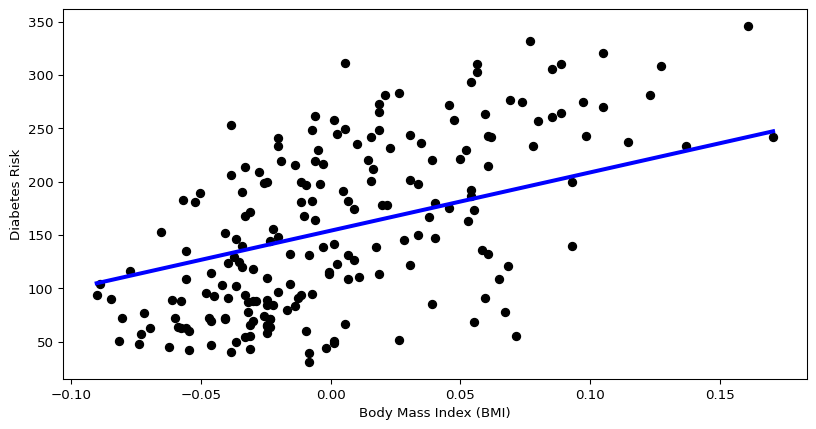

# Model Fitting & Optimization

Prince (2023, chap. 6)

## Gradient Descent[1]

where $\alpha$ fixed learning rate or line search.



## Nonlinear Model

Loss functions generally non-convex, possibly multiple local minima.



## Stochastic Gradient Descent



## Stochastic Gradient Descent [2]

Compute gradient on a mini-batch $B_t$ of data points

-   Sampled without replacement within each epoch (sweep of training
    data).
-   Learning rate often decreasing over time.

. . .



## Nesterov Accelerated Momentum [3]

adds momentum ($m_t$) *before* evaluating gradient.





## Adaptive Moment Estimation (Adam) [4]

Normalizes the gradient while relying on momentum to avoid convergence
issues.

## Adaptive Moment Estimation (Adam)

[1] Cauchy (1847)

[2] Robbins & Monro (1951)

[3] Nesterov (1983)

[4] Kingma & Ba (2015)

## Adaptive Moment Estimation (Adam)



# PyTorch

## PyTorch

## Setup

In [4]:
import torch
from torch import nn
import torch.optim as optim
from torchvision import datasets
from torch.utils.data import DataLoader
from torchvision.transforms import ToTensor, Compose, Grayscale
import random 

if torch.backends.mps.is_available():
  DEVICE = torch.device("mps") # Apple Silicon Metal Performance Shaders
elif torch.cuda.is_available():
  DEVICE = torch.device("cuda") # GPU
else:
  DEVICE = torch.device("cpu") # CPU

Key components:

-   tensors are like numpy arrays but GPU-accelerated
-   autograd

## Tensors

Tensors “live” on a device

In [5]:
X_train = torch.tensor(X.values, dtype=torch.float32).to(DEVICE)
y_train = torch.tensor(y.values, dtype=torch.float32).to("cpu")
print(X_train.device)
X_train =X_train.to("cpu")
print(X_train.device)

mps:0
cpu

## The Previous Regression

In [6]:
solution = torch.linalg.lstsq(X_train, y_train)
coefficients = solution.solution[:-1].flatten()  # All coefficients except the intercept
intercept = solution.solution[-1].item()  # Intercept
print(coefficients[2], intercept)

tensor(519.8459) 152.13348388671875

## The Previous Regression

In [7]:
class LinearRegressionModel(nn.Module):
    def __init__(self, input_dim):
        super(LinearRegressionModel, self).__init__()
        self.linear = nn.Linear(input_dim, 1)

    def forward(self, x):
        return self.linear(x)

model = LinearRegressionModel(input_dim=X_train.shape[1])
criterion = nn.MSELoss() 
# optimizer = optim.SGD(model.parameters(), lr=0.01)
optimizer = optim.Adam(model.parameters(), lr=0.01)

# Training loop
epochs = 15000
for epoch in range(epochs):
    # Forward pass
    outputs = model(X_train)
    loss = criterion(outputs, y_train)

    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if (epoch + 1) % 1000 == 0:
        print(f'Epoch [{epoch + 1}/{epochs}], Loss: {loss.item():.4f}')

# Display the model's coefficients
for name, param in model.named_parameters():
    if param.requires_grad:
        print(f'{name}: {param.data.numpy()}')

/Users/sfb41/.pyenv/versions/MLenv/lib/python3.13/site-packages/torch/nn/modules/loss.py:610: UserWarning: Using a target size (torch.Size([442])) that is different to the input size (torch.Size([442, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch [1000/15000], Loss: 23467.3047
Epoch [2000/15000], Loss: 18931.7148
Epoch [3000/15000], Loss: 15229.5312
Epoch [4000/15000], Loss: 12259.9580
Epoch [5000/15000], Loss: 9952.4492
Epoch [6000/15000], Loss: 8248.5596
Epoch [7000/15000], Loss: 7087.1538
Epoch [8000/15000], Loss: 6391.3350
Epoch [9000/15000], Loss: 6056.5981
Epoch [10000/15000], Loss: 5947.9380
Epoch [11000/15000], Loss: 5930.6782
Epoch [12000/15000], Loss: 5929.8892
Epoch [13000/15000], Loss: 5929.8848
Epoch [14000/15000], Loss: 5929.8848
Epoch [15000/15000], Loss: 5929.8848
linear.weight: [[ 1.18188036e-04  8.97059072e-05  8.45259347e-05  1.00774967e-04
   1.03135339e-04  1.28595100e-04 -1.09858142e-04  1.17865340e-04
   1.02809427e-04  1.30146393e-04  7.62095032e+01]]
linear.bias: [75.92346]

## Datasets

Label: horse
Image size: torch.Size([3, 32, 32])

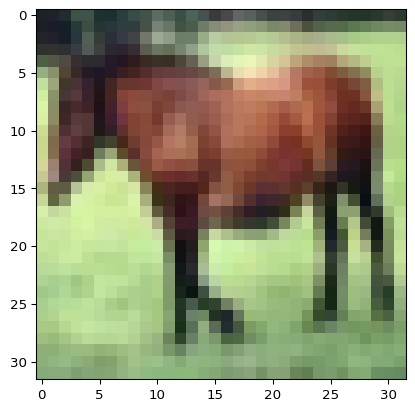

In [8]:
training_data = datasets.CIFAR10(
    root="data",  # path where the images will be stored
    train=True,
    download=True,
    transform=ToTensor()
    )
test_data = datasets.CIFAR10(
    root="data",
    train=False,
    download=True,
    transform=ToTensor()
    )
image, label = training_data[7]
print(f"Label: {training_data.classes[label]}")
print(f"Image size: {image.shape}")
plt.imshow(image.permute(1, 2, 0)) # imshow expects channel order Height x Width x Color(RGB)
plt.show()

## Data Loader

In [9]:
# Data Loader for Batching
def seed_worker(worker_id):
  worker_seed = torch.initial_seed() % 2**32
  numpy.random.seed(worker_seed)
  random.seed(worker_seed)
g_seed = torch.Generator()
g_seed.manual_seed(torch.initial_seed() % 2**32)

train_dataloader = DataLoader(training_data, batch_size=64, shuffle=True, num_workers=2, worker_init_fn=seed_worker, generator=g_seed)
test_dataloader = DataLoader(test_data,  batch_size=64, shuffle=True, num_workers=2, worker_init_fn=seed_worker, generator=g_seed)

# Load the next batch
batch_images, batch_labels = next(iter(train_dataloader))
print('Batch size:', batch_images.shape)
plt.imshow(batch_images[0].permute(1, 2, 0))
plt.show()

## PyTorch Example using Adam on CIFAR-10

# Measuring Performance

Prince (2023, chap. 8)

## Model Evaluation

polynomial least squares, bias-variance tradeoff and overfitting,
inductive bias, training/test set and cross-validation, double descent

# Regularization: Ridge and Lasso Regression

Prince (2023, chap. 9)

## References

Prince, Simon J. D. 2023. *Understanding Deep Learning*. Cambridge,
Massachusetts: The MIT Press.